# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:
* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dogImages`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [ ]:
!wget https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip; unzip dogImages.zip; rm dogImages.zip

In [ ]:
!wget http://vis-www.cs.umass.edu/lfw/lfw.tgz; tar zxvf lfw.tgz; rm lfw.tgz

In [1]:
# Python API
import random
from glob import glob
from pathlib import Path
import json
import inspect
import typing
from typing import Sequence
import os

# cv libraries
from PIL import Image, ImageFile
# Set PIL to be tolerant of image files that are truncated.
ImageFile.LOAD_TRUNCATED_IMAGES = True
import cv2               
import dlib
import face_recognition

# utilities & wrangling
from tqdm import tqdm
import pandas as pd
import numpy as np


# pytorch
import torch
import torchvision.models as models
from torchvision import datasets, transforms
from torchvision import transforms as T
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


# visualization
import seaborn as sns
import matplotlib.pyplot as plt                        
%matplotlib inline  

In [3]:
# load filenames for human and dog images
human_files = np.array(glob("lfw/*/*"))
dog_files = np.array(glob("dogImages/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


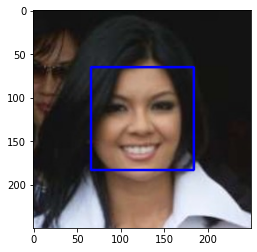

In [11]:
#pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [15]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

***Util functions***

In [16]:
def eval_detector(detector: typing.Callable, images: []):
    num_instances_found = len(list(filter(lambda img: detector(img), images)))
    return (num_instances_found * 100) / len(images)

def vis_images(images: [], figsize=(18,10)):
    fig, axes = plt.subplots(figsize=figsize,ncols=len(images))
    axes = [axes] if isinstance(axes, plt.Axes) else axes
    for img, ax in zip(images, axes):
        img = Image.open(img)
        ax.imshow(np.asarray(img))
    plt.show()

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

In [4]:
human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

accuracy om humans dataset 99.0 %
accuracy on dogs dataset 10.0 %


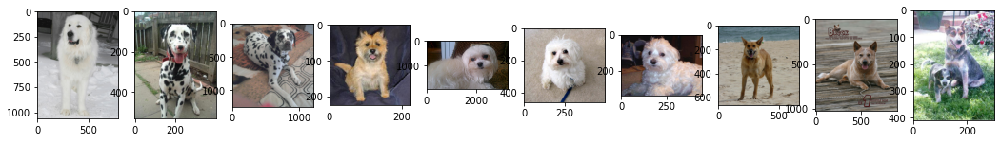

In [18]:
print("accuracy om humans dataset {} %".format(eval_detector(face_detector,human_files_short)))
print("accuracy on dogs dataset {} %".format(eval_detector(face_detector,dog_files_short)))
# filter the images where the faces detector got confused and  found faces in the dog pictures
images = list(filter(lambda img: face_detector(img), dog_files_short))
vis_images(images)

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

***histogram of oriented gradients (HOG) and linear SVM***

accuracy om humans dataset 100.0 %
accuracy on dogs dataset 5.0 %


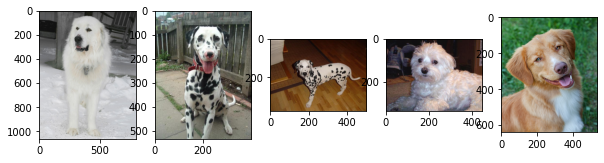

In [19]:
hog_detector = dlib.get_frontal_face_detector()
def face_hog_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces_hog = hog_detector(gray, 1)
    del img
    del gray
    return len(faces_hog) > 0
print("accuracy om humans dataset {} %".format(eval_detector(face_hog_detector,human_files_short)))
print("accuracy on dogs dataset {} %".format(eval_detector(face_hog_detector,dog_files_short)))
# filter the images where the faces detector got confused and  found faces in the dog pictures
images = list(filter(lambda img: face_hog_detector(img), dog_files_short))
vis_images(images, figsize=(10,5))

***Using CNN***

accuracy om humans dataset 100.0 %
accuracy on dogs dataset 1.0 %


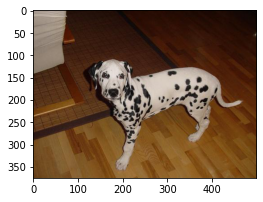

In [20]:
model_weights = "mmod_human_face_detector.dat"
if not Path(model_weights).exists():
    !wget http://arunponnusamy.com/files/mmod_human_face_detector.dat

cnn_face_detector = dlib.cnn_face_detection_model_v1(model_weights)
def face_CNN_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray,(250,250))
    faces = cnn_face_detector(gray, 1)
    del img
    del gray
    return len(faces) > 0

print("accuracy om humans dataset {} %".format(eval_detector(face_CNN_detector,human_files_short)))
print("accuracy on dogs dataset {} %".format(eval_detector(face_CNN_detector,dog_files_short)))
# filter the images where the faces detector got confused and  found faces in the dog pictures
images = list(filter(lambda img: face_CNN_detector(img), dog_files_short))
vis_images(images, figsize=(4,4))

***Using Face Detection Library***

accuracy om humans dataset 100.0 %
accuracy on dogs dataset 1.0 %


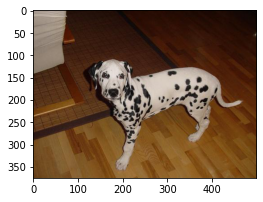

In [21]:

def face_detection_lib_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray,(250,250))
    face_locations = face_recognition.face_locations(gray, model="cnn")
    del img
    del gray
    return len(face_locations)

print("accuracy om humans dataset {} %".format(eval_detector(face_detection_lib_detector, human_files_short)))
print("accuracy on dogs dataset {} %".format(eval_detector(face_detection_lib_detector, dog_files_short)))
# filter the images where the faces detector got confused and  found faces in the dog pictures
images = list(filter(lambda img: face_detection_lib_detector(img),dog_files_short))
vis_images(images, figsize=(4,4))

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [22]:
# define VGG16 model
VGG16 = models.vgg16(pretrained=True)
# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()
VGG16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

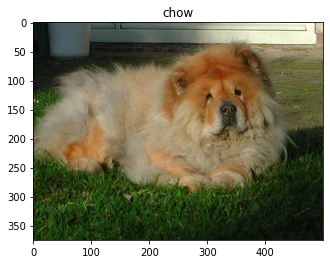

In [23]:
def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to
    predicted ImageNet class for image at specified path
    Args:
    img_path: path to an image
    Returns:
    Index corresponding to VGG-16 model's prediction
    '''
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
    # VGG-16 Takes 224x224 images as input, so we resize all of them
    VGG16.eval()
    vgg16_transform = transforms.Compose([
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
    ])
    image = vgg16_transform(Image.open(img_path)).unsqueeze(0)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    image = image.to(device)#image.cuda() # move image to the device
    predictions = VGG16(image) # predicted class index
    indices = predictions.sort(descending=True).indices.cpu()
    return indices.squeeze().tolist()[0]


img_path = dog_files[0]
predicted_class = VGG16_predict(img_path)
labels_map = "imagenet_class_index.json"
if not Path(labels_map).exists():
    !wget https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json
labels_map_dict = json.load(open(labels_map))
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.title(labels_map_dict[str(predicted_class)][-1])
plt.imshow(img)
plt.show()

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [24]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    ## TODO: Complete the function.
    return VGG16_predict(img_path) in list(range(151, 268))
print(dog_detector(dog_files[0]))
print(dog_detector(human_files[0]))

True
False


### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 


In [25]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
print(eval_detector(dog_detector, human_files_short))
print(eval_detector(dog_detector, dog_files_short))

0.0
94.0


We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [27]:
#load pretrained models
pre_trained_models = dict(inspect.getmembers(models, inspect.isfunction))
pre_trained_models = {name:model for name,model in pre_trained_models.items() if 
                      name.startswith(("vgg","alex", "google", "resnet", "dense", "squeeze","inception"))}

In [32]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
transforms = T.Compose([T.Resize(256), T.CenterCrop(224), T.ToTensor()])

def transfer_learning_dog_detector(model, img_path):        
    image = transforms(Image.open(img_path)).unsqueeze(0) # load the image
    image = image.to(device)# move image to the device
    predictions = model(image) # predicted class index
    indices = predictions.sort(descending=True).indices.cpu()
    predicted_index = indices.squeeze().tolist()[0]
    return predicted_index in list(range(151, 268))

def eval_transfer_learning_dog_detector(model, images):
    model.eval()        
    model.to(device) # move the model to the selected device
    num_instances_found = len(list(filter(lambda img: transfer_learning_dog_detector(model,img), images)))
    accuracy = (num_instances_found * 100) / len(images)
    return accuracy

images = dog_files_short
eval_results_dict = {}
for model_name, model_fn in pre_trained_models.items():
    model =  model_fn(pretrained=True)
    eval_results_dict[model_name] = eval_transfer_learning_dog_detector(model,images)
    eval_results_dict = dict(sorted(eval_results_dict.items(),key=lambda item: item[1], reverse = True))
    del model

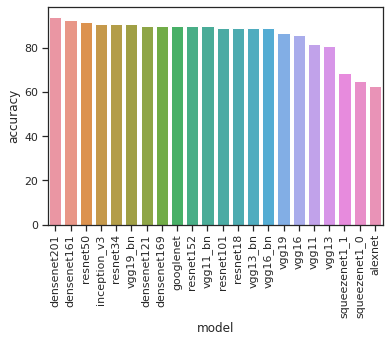

,model,accuracy
0,densenet201,94.0
1,densenet161,93.0
2,resnet50,92.0
3,inception_v3,91.0
4,resnet34,91.0
5,vgg19_bn,91.0
6,densenet121,90.0
7,densenet169,90.0
8,googlenet,90.0
9,resnet152,90.0


In [33]:
sns.set(style="ticks", color_codes=True)
df = pd.DataFrame(columns=["model", "accuracy"])
df["model"] = list(eval_results_dict.keys())
df["accuracy"] = list(eval_results_dict.values())
sns.barplot(x="model", y="accuracy",data=df)
plt.xticks(rotation=90)
plt.show()
df

---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [21]:
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes
TARGET_SIZE = (224, 224)
BATCH_SIZE = 20
DATA_DIR = "dogImages"

class CustomRotation:
    def __init__(self, angles: Sequence[int]):
        self.angles = angles

    def __call__(self, x):
        angle = random.choice(self.angles)
        return TF.rotate(x, angle)

standard_normalization = T.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
#standard_normalization = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
train_transforms = T.Compose([T.RandomHorizontalFlip(),
                                        #CustomRotation(angles=[30, 45, 20]),
                                        T.RandomRotation(40),
                                        T.Resize(TARGET_SIZE),
                                        T.ToTensor(),
                                        # ColorTransform("hsv"),
                                        standard_normalization])
                                        #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

val_transforms = T.Compose([T.Resize(TARGET_SIZE),
                                        T.ToTensor(),
                                        standard_normalization
                                        #ColorTransform("hsv"),
                                        ])

test_transforms = T.Compose([T.Resize(TARGET_SIZE),
                                    T.ToTensor(),
                                  standard_normalization
                                    #ColorTransform("hsv"),
                                    ])


train_data = datasets.ImageFolder(DATA_DIR + '/train', transform=train_transforms)
val_data = datasets.ImageFolder(DATA_DIR + '/valid', transform=val_transforms)
test_data = datasets.ImageFolder(DATA_DIR + '/test', transform=test_transforms)
classes = train_data.classes

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle = True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE)


loaders_scratch = {}
loaders_scratch["train"] = train_loader
loaders_scratch["valid"] = val_loader
loaders_scratch["test"] = test_loader

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:

**How does your code resize the images (by cropping, stretching, etc)?**

"Pytorch vision transforms" offers several methods to manipulate and augment our dataset. However, we have to be careful when choosing which ones to use, since they may add noise to the images, remove relevant features or even delete the object of interest completely ( As can be observed in the visualization made below), this can vary according to the dataset. For that reason on the dogs' dataset, the "Vision Resize" transformation was applied for resizing the images, considering that it doesn't affect the images som much in comparison with the others.

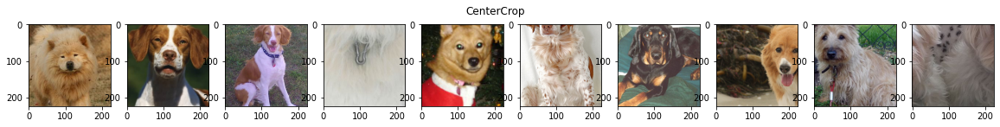

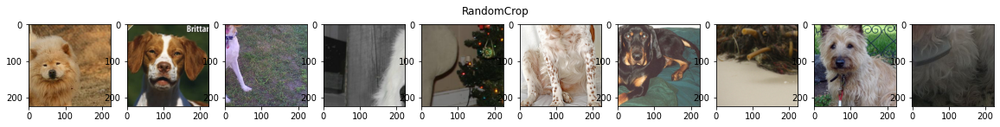

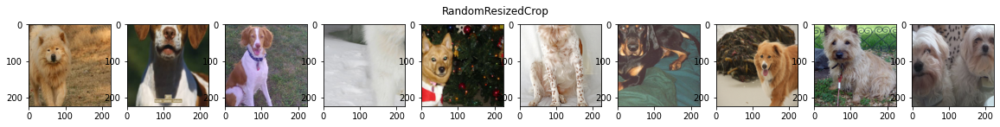

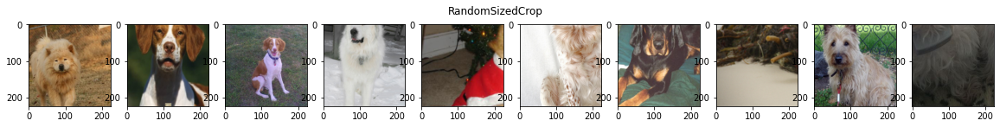

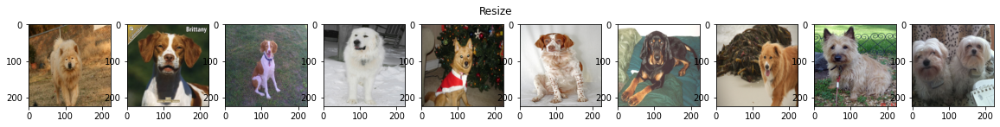

In [134]:
import warnings
images = random.choices(dog_files_short, k=10)
images = [Image.open(img) for img in images]
transforms = {t_name:t_cls for t_name, t_cls in inspect.getmembers(T, inspect.isclass) if "Crop" in t_name or "Resize" in t_name}
with warnings.catch_warnings(record=True) as w:    
    
    for t_name, t_cls in transforms.items():
        try:              
            fig, axes = plt.subplots(ncols=len(images), figsize=(20,2))
            for img,ax in zip(images, axes):      
                transforms =T.Compose([
                    T.ToPILImage(),
                    t_cls([224, 224])                    
                ])
                out = transforms(np.asarray(img))                                
                ax.imshow(out)
            fig.suptitle(t_name)
            plt.show()
        except Exception as ex:            
            plt.close()
        

**Did you decide to augment the dataset?**
Given that the number of images by class in the dataset was low and imbalanced, according to the literature, employing data augmentation techniques contribute positively to reduce underfitting problems and increase the change that the model learns to generalize between classes (since more samples are added during the training process). For that reason, the dataset was augmented using Horizontal Flip, RandomRotation, Resize, and Normalization. Additionally, a custom transformation for rotation was tested.

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [135]:

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self, ):
        super(Net, self).__init__()        
        # max pool = 2, # input_size / max pool 
        self.conv_block_1 = self.conv_block(3, 16) 
        self.conv_block_2 = self.conv_block(16, 32)
        self.conv_block_3 = self.conv_block(32, 64)
        self.conv_block_4 = self.conv_block(64, 128)
        self.conv_block_5 = self.conv_block(128, 256)
        self.conv_block_6 = self.conv_block(256, 512)
        # dropout layers
        self.dropout1 = nn.Dropout(0.2)        
        self.dropout2 = nn.Dropout(0.5)                
        self.flatten = nn.Flatten()        
        # fully connected layers
        #self.fc1 = nn.Linear(256 * 7 * 7, 2000)
        self.fc1 = nn.Linear(512 * 3 * 3, 2000)
        self.fc2 = nn.Linear(2000,133)# 133 => num classes

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(),            
            nn.MaxPool2d((2, 2)),
            nn.BatchNorm2d(out_channels)
        )
    def forward(self, x):
        ## extra features        
        x = self.conv_block_1(x)        
        x = self.conv_block_2(x)
        x = self.conv_block_3(x)
        x = self.conv_block_4(x)
        x = self.conv_block_5(x)
        x = self.conv_block_6(x)                
        # flatten features
        x = self.dropout1(x)
        x = self.flatten(x)
        #x = x.view(-1, 512 * 1 * 1)                
        x = F.relu(self.fc1(x))        
        x = self.dropout2(x)
        x = self.fc2(x)
        return x

model_scratch = Net()
use_cuda = torch.cuda.is_available()
# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ 

After having tested different CNN architectures, trying to overcome the overfitting and underfitting problems, the design of best model architecture (with a 45% accuracy) can be observed in the cell above. 
The proposed architecture starts with a fixed size input layer (224x224x3), which established the required dimensions of the image, followed by six blocks of 2 convolutional layers (with incrementally higher kernel levels (16,32,64, 128, 256, 512)), one max-pooling layer, and a BatchNorm2D one. These blocks extract the image patterns. Then, to keep only the relevant features by class and reduce overfitting issues, a dropout layer of 0.2  is seated next. Once the image pass across all the model, the result is flattened and passed across a second fully connected layer to do the classification.

In [137]:
model_scratch

Net(
  (conv_block_1): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): ReLU()
    (3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv_block_2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): ReLU()
    (3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv_block_3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): ReLU()
    (3): MaxPool2d(kernel_size=(2,

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [9]:
criterion_scratch =nn.CrossEntropyLoss()
#optimizer_scratch = optim.Adam(model_scratch.parameters(), lr = 0.0001)
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.01)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [51]:
def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (batch, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                batch, target = batch.cuda(), target.cuda()
            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(batch)#model.forward(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (batch, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                batch, target = batch.cuda(), target.cuda()
                # forward pass: compute predicted outputs by passing inputs to the model
            output = model(batch)
            # calculate the batch loss
            loss = criterion(output, target)            
            # update average validation loss            
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
            

            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        
        ## TODO: save the model if validation loss has decreased        
        if valid_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
                valid_loss_min,
                valid_loss))
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
            
    # return trained model
    return model

In [5]:
# train the model
model_scratch = train(30, loaders_scratch, model_scratch, optimizer_scratch, criterion_scratch, use_cuda, 'model_scratch.pt')
# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

Epoch: 1 	Training Loss: 4.632224 	Validation Loss: 4.405573
Validation loss decreased (inf --> 4.405573).  Saving model ...
Epoch: 2 	Training Loss: 4.229095 	Validation Loss: 4.047559
Validation loss decreased (4.405573 --> 4.047559).  Saving model ...
Epoch: 3 	Training Loss: 3.999931 	Validation Loss: 3.892658
Validation loss decreased (4.047559 --> 3.892658).  Saving model ...
Epoch: 4 	Training Loss: 3.811072 	Validation Loss: 4.008424
Epoch: 5 	Training Loss: 3.625137 	Validation Loss: 3.593728
Validation loss decreased (3.892658 --> 3.593728).  Saving model ...
Epoch: 6 	Training Loss: 3.455044 	Validation Loss: 3.494127
Validation loss decreased (3.593728 --> 3.494127).  Saving model ...
Epoch: 7 	Training Loss: 3.288841 	Validation Loss: 3.414699
Validation loss decreased (3.494127 --> 3.414699).  Saving model ...
Epoch: 8 	Training Loss: 3.134633 	Validation Loss: 3.565268
Epoch: 9 	Training Loss: 2.970034 	Validation Loss: 3.416632
Epoch: 10 	Training Loss: 2.846563 	Valida

<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [12]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

model_scratch.load_state_dict(torch.load('model_scratch.pt'))
# call test function    
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 2.107037


Test Accuracy: 46% (391/836)


---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [2]:
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes
TARGET_SIZE = (224,224)
BATCH_SIZE = 20
DATA_DIR = "dogImages"


standard_normalization = T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#transform = T.Compose([T.Resize(256), T.CenterCrop(224), T.ToTensor()])
#dataset = datasets.ImageNet(".", split="train", transform=transform)

train_transforms = T.Compose([T.RandomHorizontalFlip(),
                                        #CustomRotation(angles=[30, 45, 20]),
                                        T.RandomRotation(40),
                                        T.Resize(TARGET_SIZE),
                                        T.ToTensor(),
                                        # ColorTransform("hsv"),
                                        standard_normalization])
                                        #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

val_transforms = T.Compose([T.Resize(TARGET_SIZE),
                                        T.ToTensor(),
                                        standard_normalization
                                        #ColorTransform("hsv"),
                                        ])

test_transforms = T.Compose([T.Resize(TARGET_SIZE),
                                        T.ToTensor(),
                                      standard_normalization
                                        #ColorTransform("hsv"),
                                        ])




train_data = datasets.ImageFolder(DATA_DIR + '/train', transform=train_transforms)
val_data = datasets.ImageFolder(DATA_DIR + '/valid', transform=val_transforms)
test_data = datasets.ImageFolder(DATA_DIR + '/test', transform=test_transforms)
classes = train_data.classes

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle = True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE)


loaders_transfer = {}
loaders_transfer["train"] = train_loader
loaders_transfer["valid"] = val_loader
loaders_transfer["test"] = test_loader

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [14]:
## TODO: Specify model architecture 
model_transfer = models.vgg19_bn(pretrained=True)   
for param in model_transfer.features.parameters():
    param.requires_grad = False
n_inputs = model_transfer.classifier[6].in_features
last_layer = nn.Linear(n_inputs, len(classes))
model_transfer.classifier[6] = last_layer
use_cuda = torch.cuda.is_available()
if use_cuda:    
    model_transfer = model_transfer.cuda()

__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 
Previously different transfer learning models were used to detect dogs within an image; based on the achieved results, the VGG19-bn (An extension of the VGG19 with batch normalization) was selected. So, we can notice, it wasn't the best, however, was in the top 6, and the accuracy was similar. This architecture was mainly chosen over the others since it is less complex, and this fact has a significant impact during the re-training process.

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [15]:
criterion_transfer = nn.CrossEntropyLoss()
# Observe that all parameters are being optimized
optimizer_transfer = optim.SGD(model_transfer.parameters(), lr=0.001, momentum=0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [52]:
# train the model
model_transfer = train(30, loaders_transfer, model_transfer, optimizer_transfer, criterion_transfer, use_cuda, 'model_transfer.pt')
# load the model that got the best validation accuracy (uncomment the line below)

Epoch: 1 	Training Loss: 2.316495 	Validation Loss: 0.761674
Validation loss decreased (inf --> 0.761674).  Saving model ...
Epoch: 2 	Training Loss: 0.929005 	Validation Loss: 0.570569
Validation loss decreased (0.761674 --> 0.570569).  Saving model ...
Epoch: 3 	Training Loss: 0.771095 	Validation Loss: 0.544876
Validation loss decreased (0.570569 --> 0.544876).  Saving model ...
Epoch: 4 	Training Loss: 0.668360 	Validation Loss: 0.537852
Validation loss decreased (0.544876 --> 0.537852).  Saving model ...
Epoch: 5 	Training Loss: 0.629562 	Validation Loss: 0.481784
Validation loss decreased (0.537852 --> 0.481784).  Saving model ...
Epoch: 6 	Training Loss: 0.568815 	Validation Loss: 0.489931
Epoch: 7 	Training Loss: 0.524204 	Validation Loss: 0.458178
Validation loss decreased (0.481784 --> 0.458178).  Saving model ...
Epoch: 8 	Training Loss: 0.486952 	Validation Loss: 0.486215
Epoch: 9 	Training Loss: 0.473715 	Validation Loss: 0.491422
Epoch: 10 	Training Loss: 0.440288 	Valida

<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [17]:
model_transfer.load_state_dict(torch.load('model_transfer.pt'))
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)
torch.save(model_transfer, "full_transfer_model.pt")

Test Loss: 0.434346


Test Accuracy: 87% (729/836)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [292]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.
# list of class names by index, i.e. a name can be accessed like class_names[0]
class_names = [item[4:].replace("_", " ") for item in train_data.classes]
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
def predict_breed_transfer(model, img_path, k = 5):
    if model.training:
        model.eval()
    image_transform = transforms.Compose([
        transforms.Resize((224,244)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
    ])
    image = image_transform(Image.open(img_path).convert("RGB")).unsqueeze(0)
    image = image.to(device)#image.cuda() # move image to the device
    pred = model(image) # predicted class index    
    pred = F.softmax(pred, dim=1).detach()
    top_probs, top_indices = pred.topk(k,sorted=True)
    top_probs = top_probs.cpu().numpy().squeeze().round(2).tolist()
    top_indices = top_indices.cpu().numpy().squeeze().tolist()
    top_classes = [class_names[idx] for idx in top_indices]
    return  list(zip(top_classes,top_probs))



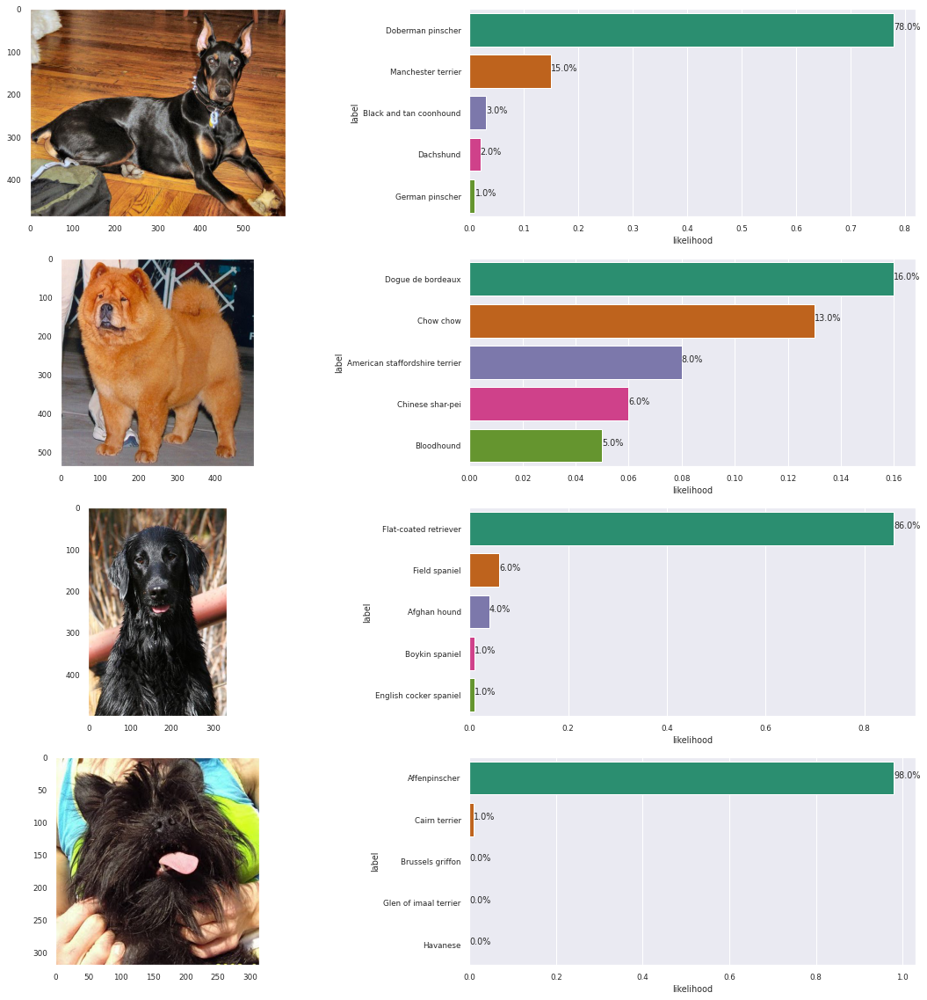

In [214]:
from mpl_toolkits.axes_grid1 import ImageGrid
images_test = glob("dogImages/test/*/*")
images_test = random.choices(images_test, k=4)
fig, axes = plt.subplots(ncols=2, nrows=len(images_test), figsize=(20,20))
sns.set_style('whitegrid')
sns.set(font_scale=0.8)
for img_file, ax in zip(images_test, axes):
    # read the image from disk
    img_array = np.asarray(Image.open(img_file))
    # grab the predictions
    
    img_pred = predict_breed_transfer(model_transfer, img_file, k=5)
    # display image
    ax[0].imshow(img_array)
    ax[0].grid(False)    
    
    # display predictions
    barplot = sns.barplot(palette="Dark2",ax=ax[1],x='likelihood', y='label',data=pd.DataFrame(img_pred, columns=["label", "likelihood"]))
    for p in barplot.patches:
        percentage = '{:.1f}%'.format(p.get_width() * 100)
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2
        barplot.annotate(percentage, (x, y))        

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

### Some util functions

In [21]:
import more_itertools


def get_concat_h_multi_blank(im_list):
    _im = im_list.pop(0)
    for im in im_list:
        _im = get_concat_h_blank(_im, im)
    return _im

def get_concat_h_multi_resize(im_list, resample=Image.BICUBIC):
    min_height = min(im.height for im in im_list)
    im_list_resize = [im.resize((int(im.width * min_height / im.height), min_height),resample=resample)
                      for im in im_list]
    total_width = sum(im.width for im in im_list_resize)
    dst = Image.new('RGB', (total_width, min_height))
    pos_x = 0
    for im in im_list_resize:
        dst.paste(im, (pos_x, 0))
        pos_x += im.width
    return dst

def get_concat_v_multi_resize(im_list, resample=Image.BICUBIC):
    min_width = min(im.width for im in im_list)
    im_list_resize = [im.resize((min_width, int(im.height * min_width / im.width)),resample=resample)
                      for im in im_list]
    total_height = sum(im.height for im in im_list_resize)
    dst = Image.new('RGB', (min_width, total_height))
    pos_y = 0
    for im in im_list_resize:
        dst.paste(im, (0, pos_y))
        pos_y += im.height
    return dst

def get_concat_tile_resize(im_list_2d, resample=Image.BICUBIC):
    im_list_v = [get_concat_h_multi_resize(im_list_h, resample=resample) for im_list_h in im_list_2d]
    return get_concat_v_multi_resize(im_list_v, resample=resample)



### Detectors

In [33]:


class FaceDetector:
    def __init__(self, model_weights: str=None):
        if model_weights is None:
            model_weights = "mmod_human_face_detector.dat"
        self.detector = dlib.cnn_face_detection_model_v1(model_weights)
        
    def detect(self, image_path):        
        img = cv2.imread(image_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gray = cv2.resize(gray,(250,250))
        faces = self.detector(gray, 1)        
        del img
        del gray
        return len(faces) > 0
    
        
class DogDetector:
    def __init__(self):
        # define VGG16 model
        self.VGG16 = models.vgg16(pretrained=True)
        # check if CUDA is available
        use_cuda = torch.cuda.is_available()
        # move model to GPU if CUDA is available
        if use_cuda:
            self.VGG16 = self.VGG16.cuda()
            
    def detect(self, image_path):
        self.VGG16.eval()
        vgg16_transform = transforms.Compose([
            transforms.Resize((224,244)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
        ])
        image = Image.open(image_path).convert("RGB")
        image = vgg16_transform(image).unsqueeze(0)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        image = image.to(device)#image.cuda() # move image to the device
        pred = self.VGG16(image) # predicted class index
        label_idx = torch.argmax(pred, dim=1).cpu().numpy()[0]        
        return label_idx in list(range(151, 268))
        

class DogBreedPredictor:
    def __init__(self, class_names, model_path:str=None):
        if model_path is None:
            model_path = "full_transfer_model.pt"
        self.model = torch.load(model_path)
        self.model.eval()
        self.class_names = class_names
    
    def predict(self, img_path, k = 5):
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.model.to(device)
        if self.model.training:
            self.model.eval()
        image_transform = transforms.Compose([
            transforms.Resize((224,244)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
        ])        
        image = image_transform(Image.open(img_path).convert("RGB")).unsqueeze(0)
        image = image.to(device)#image.cuda() # move image to the device
        pred = self.model(image) # predicted class index    
        pred = F.softmax(pred, dim=1).detach()
        top_probs, top_indices = pred.topk(k,sorted=True)
        top_probs = top_probs.cpu().numpy().squeeze().round(2).tolist()
        top_indices = top_indices.cpu().numpy().squeeze().tolist()
        top_classes = [self.class_names[idx] for idx in top_indices]
        return  list(zip(top_classes,top_probs))
        

dog_detector = DogDetector()
face_detector = FaceDetector()
breed_predictor = DogBreedPredictor(train_data.classes)
    
#classes_folders = train_data.classes
def make_predictions(img_path):
    img_arr = np.asarray(Image.open(img_path))    
    img_preds = breed_predictor.predict(img_path, k=6)   
    # show image
    fig, ax = plt.subplots(ncols=3, figsize=(20,10))    
    ax[0].imshow(img_arr)        
    # show collage
    images_for_collage = []
    for label, prob in img_preds:
        random_img = random.choices(glob("dogImages/train/{}/**".format(label)), k=1)[0]
        images_for_collage.append(Image.open(random_img))
    collage = list(more_itertools.chunked(images_for_collage, 2))
    sim_dogs = get_concat_tile_resize(collage)
    ax[1].imshow(np.asarray(sim_dogs))
    # show predictions    
    barplot = sns.barplot(palette="Dark2",ax=ax[2],x='likelihood', y='label',data=pd.DataFrame(img_preds, columns=["label", "likelihood"]))
    for p in barplot.patches:
        percentage = '{:.1f}%'.format(p.get_width() * 100)
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2
        barplot.annotate(percentage, (x, y))   
    fig.tight_layout()

    

def run_app(img_path):
    ## handle cases for a human face, dog, and neither    
    if face_detector.detect(img_path):        
        make_predictions(img_path)
    elif dog_detector.detect(img_path):
        make_predictions(img_path)
    else:
        raise Exception("there is not a dog or a person either in the potho")


---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ 

The result was amazing, however, some points to improve the model may be:

- Try with more complex CNN architectures 
- I would like to give a shot with Autokeras or NasNet, to find a better model
- Add more sophisticated data augmentation techniques, that make the model sensitivity to the noise

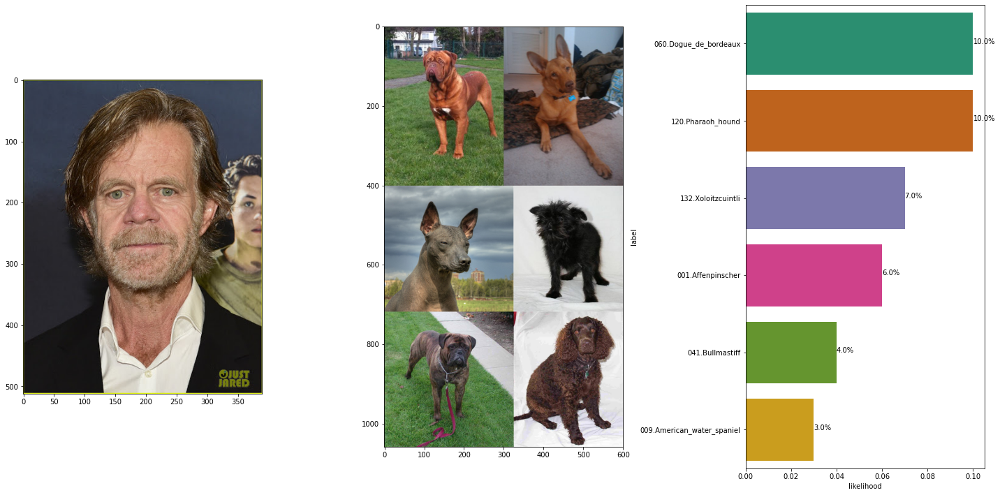

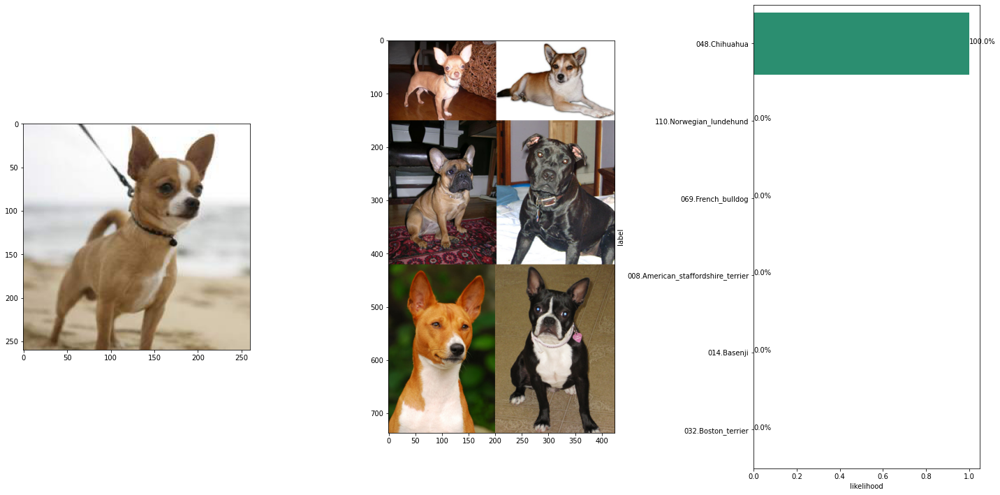

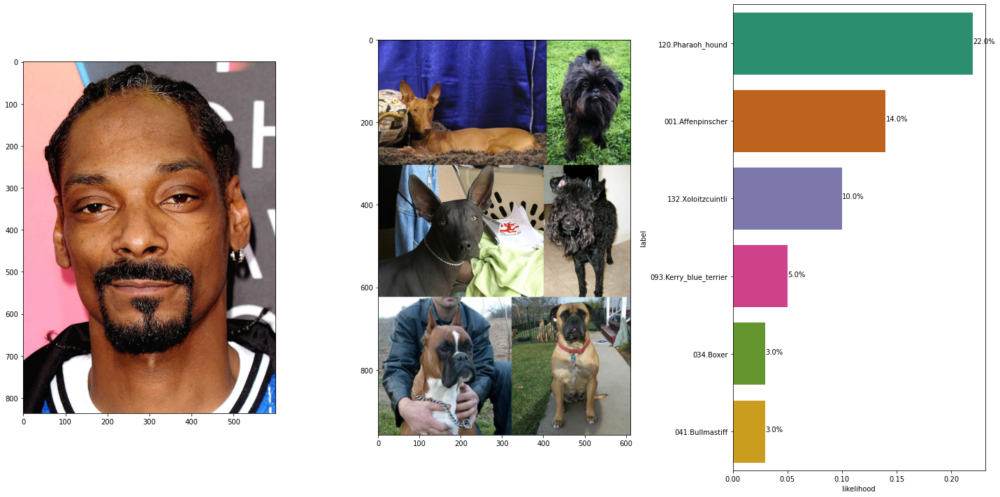

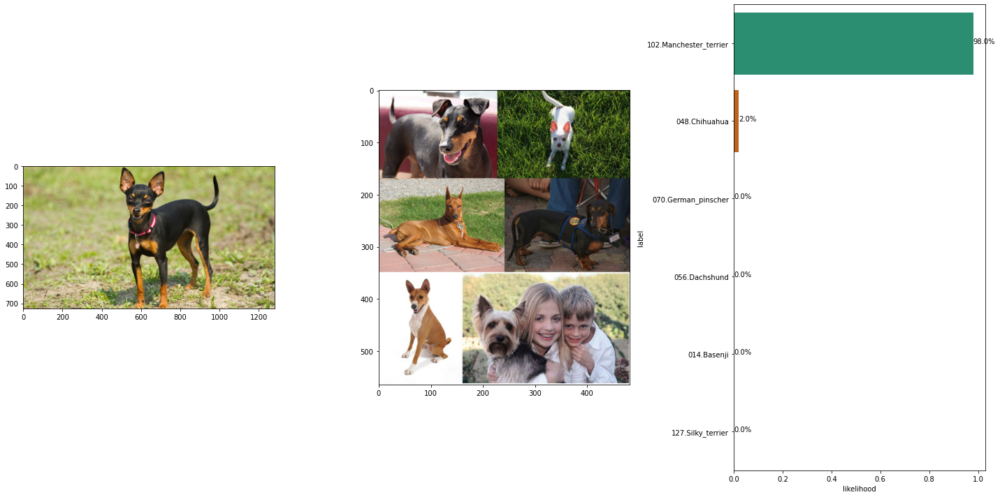

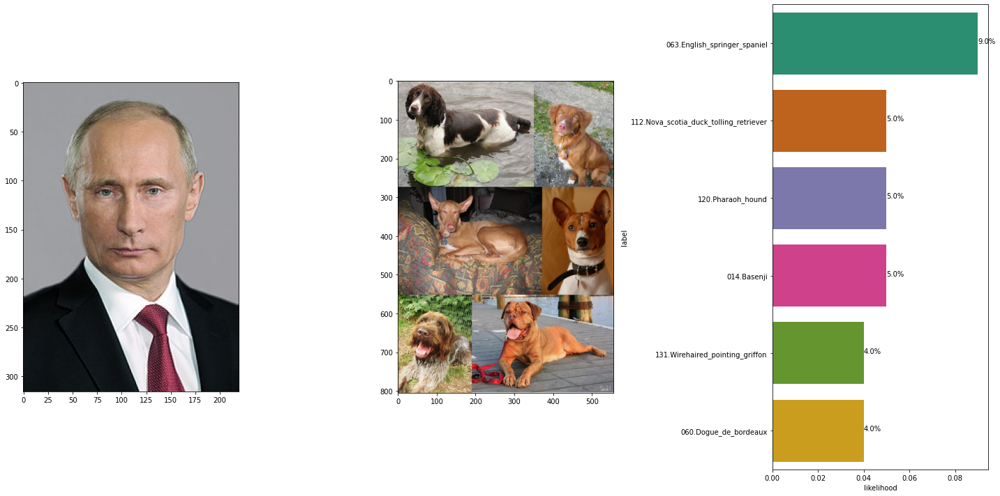

...

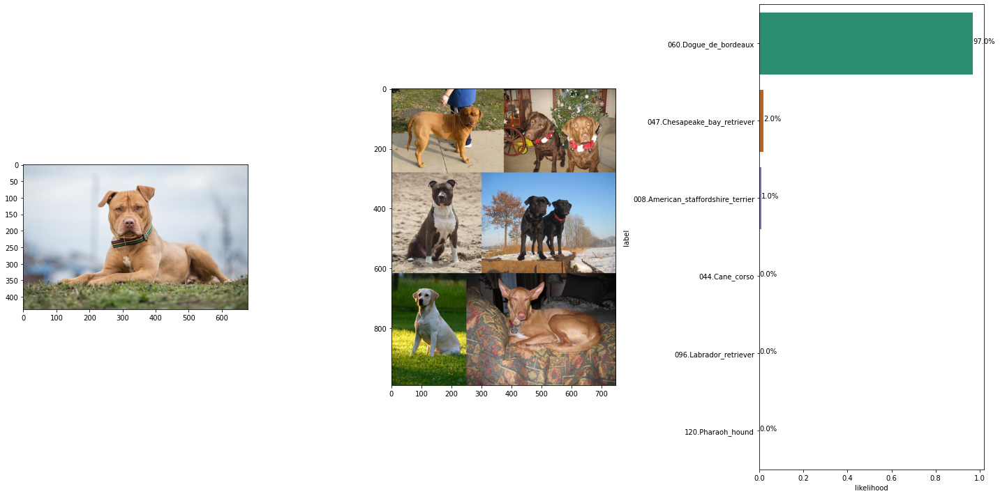

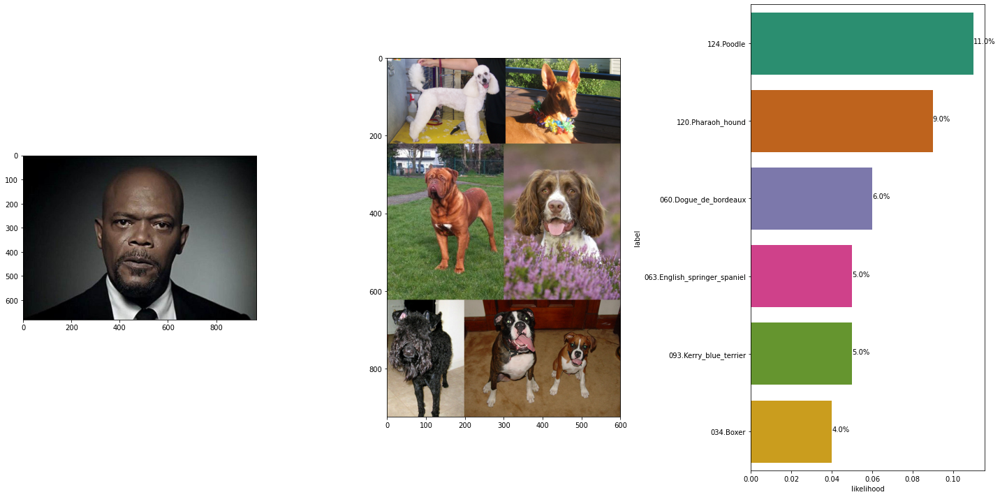

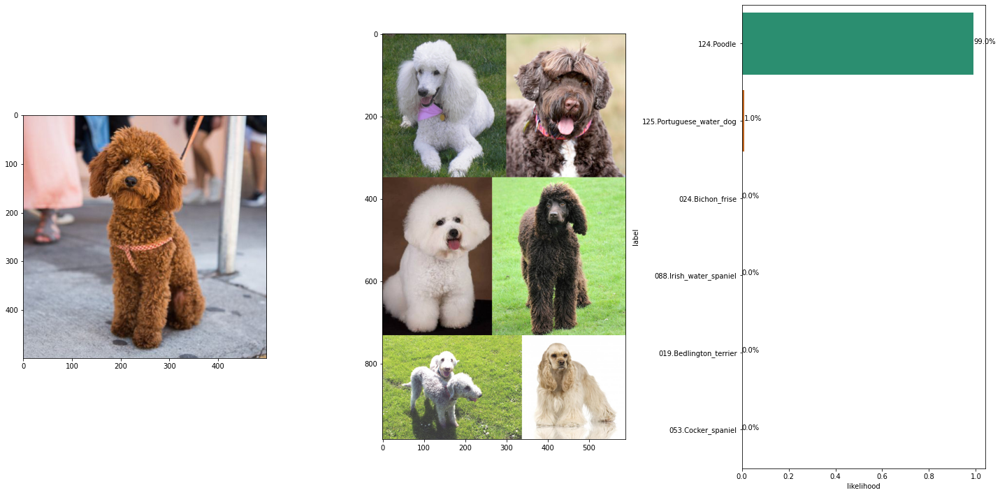

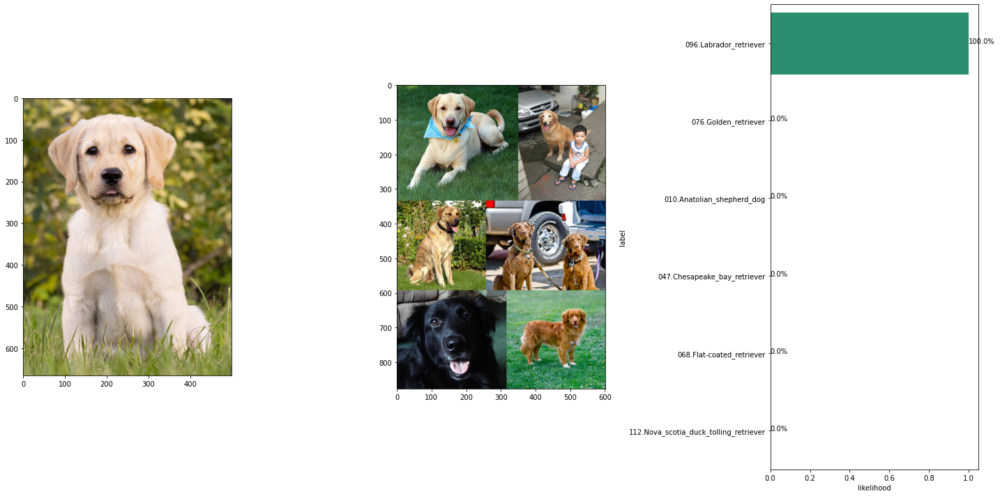

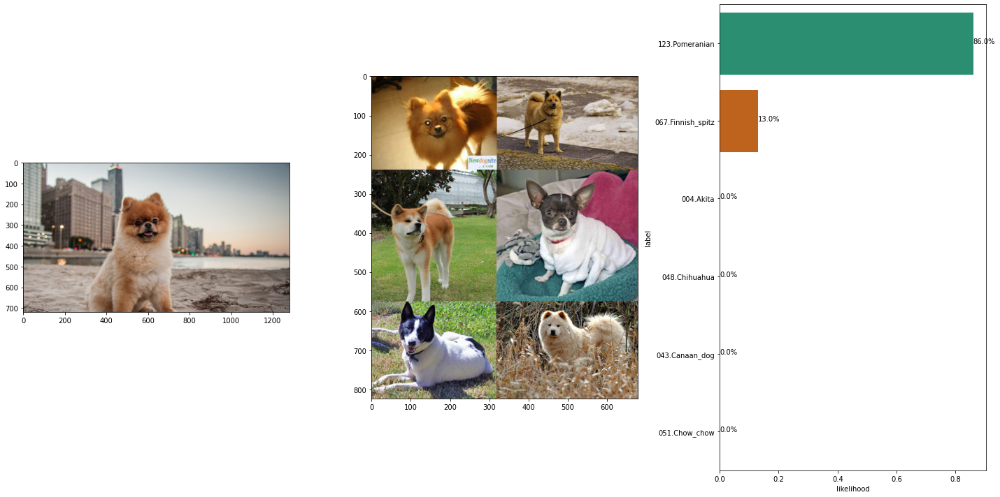

In [35]:
for file in glob("test_images/**"):
    try:
        run_app(file)        
    except Exception as ex:
        print(ex)           
